# 比率や向きに意味がある画像を機械学習用にリサイズする

imgaugやAlbumentationsというモジュールは、機械学習用に入力画像を加工してくれる便利なモジュールです。画像の変形にあわせて、オブジェクトのバインディングボックスやマスク画像も一緒に変形してくれる機能があります。これらはオブジェクトディテクションやセマンティックセグメンテーションを学習させる場合の必須の機能です。大半の変形は直感的にわかりやすいので使用に特に困難はありませんが、ひとつあまり自明でない方法が必要なものがあったので、忘備録として記事にしておきます。ちなみにAlbumentationsはimgaugより処理速度が速いのが売りのようです。

出来合いの高性能な画像認識モデルを使用する場合、特に事前学習済みの重みを使うなら、その事前学習に用いた画像の入力サイズに合わせる必要があります。そのサイズが例えば512x512の正方形だったとして、実際の入力画像が様々なサイズであった場合には、何らかの変形をしてそのサイズに収めることになります。よくみかける方法は、学習時も認識時も同様に縦横比を無視して正方形にリサイズして処理する方法です。推論結果をオリジナルのサイズにリサイズすれば所望の結果が得られます。大半の物体認識ではこれで十分ですが、例えば図面や文書などは縦横比を保持して学習、認識させたい場合もあります。その場合は、長い方の長さを正方形のサイズに合わせて縦横比を保ったままリサイズして、余白を許容して正方形の中央に配置することになります。この処理、および、この処理を施した画像に対する認識結果を元の画像に合わせて座標を戻す処理が自明ではありませんでした。


それではまず、対象となる画像を取ってきます。

In [ ]:
!wget https://upload.wikimedia.org/wikipedia/commons/1/16/Hideyoshisho01.jpg

オリジナル画像を表示させます。サイズは2119x1341です。

(2119, 1341)


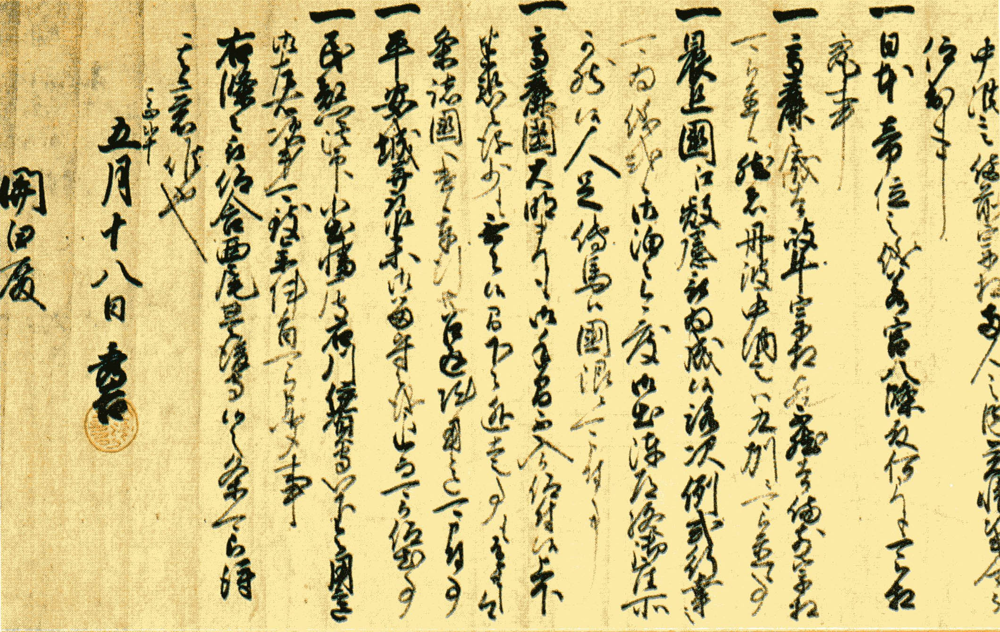

In [4]:
from PIL import Image
from IPython.display import display
with Image.open('Hideyoshisho01.jpg') as img:
    org_size = img.size
    print(org_size)
    display(img)

imgargには、CenterPadToSquare()というずばりのメソッドがあるのですが、バインディングボックスやマスク画像などを専用のクラスで定義しなければならないなど、今一つ使い勝手が悪いです。未確認ですが処理速度も遅いらしいので、いまさらimgargを使うメリットはなく、採用しませんでした。

ここでは、Albumentationsでの方法を記載します。まずはインストール。

In [ ]:
!pip install albumentations -U

次にダミーのバインディングボックスとマスク画像を作成します。

In [66]:
import numpy as np

img = Image.open('Hideyoshisho01.jpg')
# bbox == [x, y, w, h] # coco format
bboxes = [[0, 0, img.width//4, img.height//4], [img.width//4, img.height//4, img.width//8, img.height//8]]
mask = np.zeros((img.height, img.width), dtype=np.uint8)
for bbox in bboxes:
    print(bbox)
    mask[bbox[1] : bbox[1] + bbox[3], bbox[0] : bbox[0] + bbox[2]] = 255

[0, 0, 529, 335]
[529, 335, 264, 167]


マスク画像を表示してみましょう。

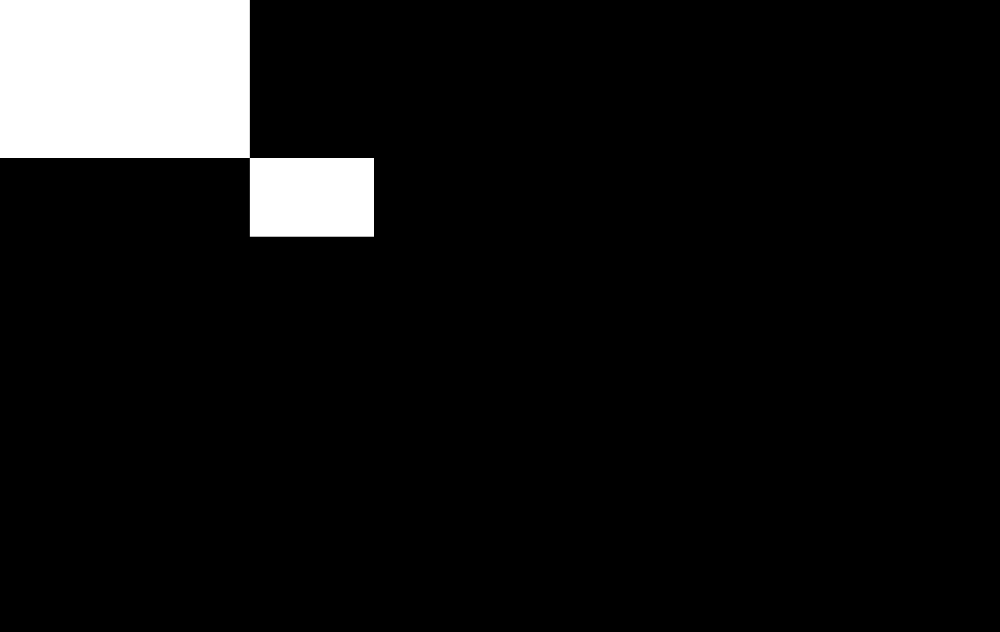

In [67]:
display(Image.fromarray(mask))

縦横比を保ったまま中央に配置には、まず、LongestMaxSize()で長辺を512になるように縦横比を保ったまま変形します。今回の場合は幅が512になります。そしてこれをPadIfNeeded()で指定した512x512の正方形の中央に配置し、余白を埋めます。この時、border_mode=0を指定します。他の値にすると余白の埋め方が画像の繰り返しなどになってしまいます。mask_valueはマスク画像の余白に埋める値を指定しますが、今回は区別しやすいように128を指定しています。マスクの各値がクラス番号を表している場合には、mask_valueは背景を表すクラスの番号（たぶん0）にすることになります。

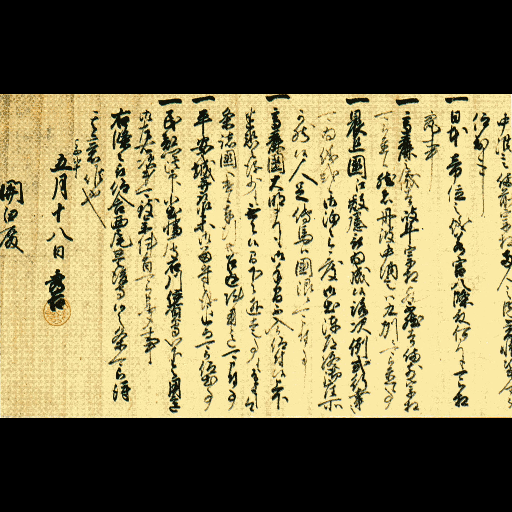

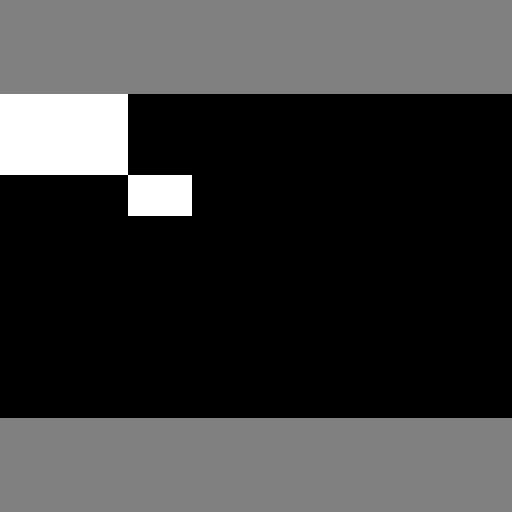

In [77]:
import albumentations as A
seq = A.Compose([
                    A.LongestMaxSize(512),
                    A.PadIfNeeded(min_height=512, min_width=512, border_mode=0, mask_value=128),
                    ])
centered = seq(image=np.array(img), mask=mask)
display(Image.fromarray(centered['image']))
print()
display(Image.fromarray(centered['mask']))

分かってしまえば簡単です。しかしこれは少し粉飾しています。バインディングボックスが省かれているのです。セマンティックセグメンテーションでは十分ですが、物体認識には足りません。
実はバインディングボックスの指定方法には(x, y, w, h)や(top, left, bottom, right)などいくつかのフォーマットがあるので、使用するフォーマットを指定しないとならないのです。今回の場合、'coco'を指定して、(x, y, w, h)にします。
また、各バインディングボックスにはそれぞれ物体のクラスのIDが付与されているはずなので、それも指定しなければなりません。今回は適当に['A', 'B']としました。

それらの要件を満たしたコードは以下になります。

In [84]:
import albumentations as A
seq = A.Compose([
                    A.LongestMaxSize(512),
                    A.PadIfNeeded(min_width=512, min_height=512, border_mode=0, mask_value=128),
], bbox_params=A.BboxParams(format='coco', label_fields=['category_ids']))
centered = seq(image=np.array(img), mask=mask, bboxes=bboxes, category_ids=['A', 'B'])
for cat, box in zip(centered['category_ids'], centered['bboxes']):
    print(cat, [int(b) for b in box])

A [0, 94, 127, 80]
B [127, 174, 63, 40]


多少コードが汚くなりましたが、無事にバインディングボックスも変換されています。

これらの変換は学習や認識の際の入力画像への変換処理として指定することになります。しかし、認識の結果は変換された入力画像に対するものなので、元の画像に対する座標やセグメンテーション画像に戻さなければなりません。

ここでは上記での変換結果centeredが認識の結果であるとして、元に戻す処理を考えます。
まずは長辺を512にしたサイズを計算します。そして、このサイズを中央から切り出して、元の大きさに戻します。以下がそのコードです。

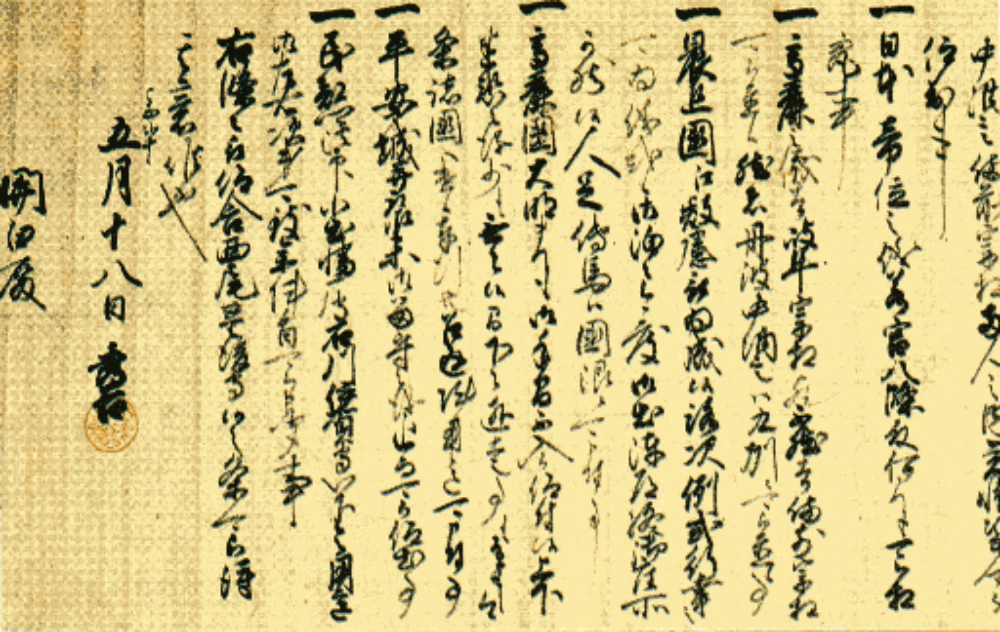

A [0, 0, 529, 334]
B [529, 334, 264, 167]


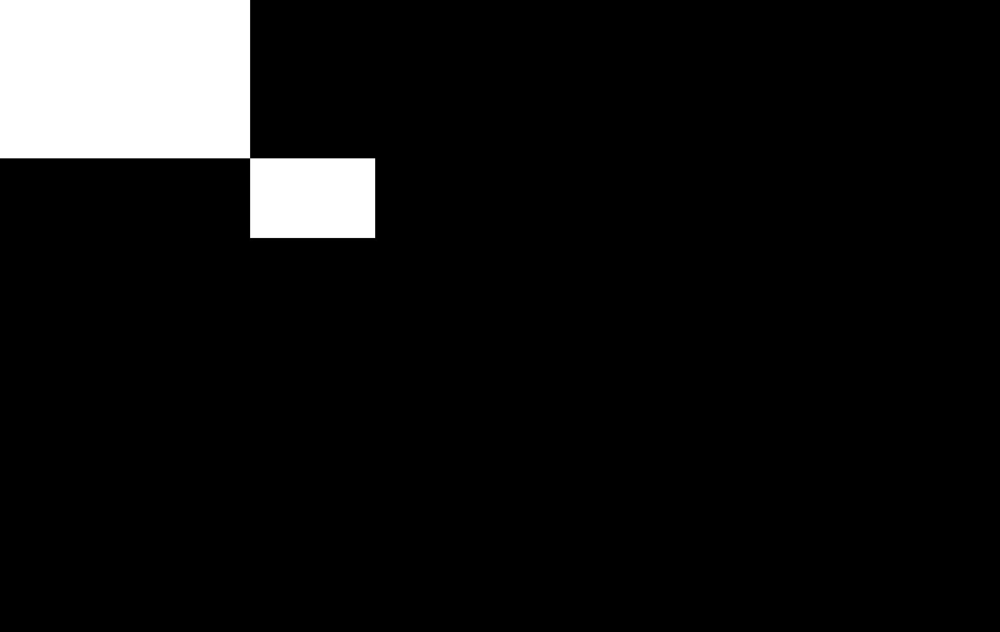

In [86]:
if img.width > img.height:
    width = 512
    height = int(img.height / img.width * 512)
else:
    height = 512
    width = int(img.width / img.height * 512)

ret = A.Compose([
                    A.CenterCrop(width=width, height=height),
                    A.Resize(width=img.width, height=img.height),
], bbox_params=A.BboxParams(format='coco', label_fields=['category_ids']))

returned = ret(**centered)
display(Image.fromarray(returned['image']))
for cat, box in zip(returned['category_ids'], returned['bboxes']):
    print(cat, [int(b) for b in box])
display(Image.fromarray(returned['mask']))


見事に元に戻っています。ちょっと丸め誤差がありますが、それはご愛嬌で。